In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torch
from models import FastResNet9, ResNet18, ResNet9, WideResNet28x10
import torchvision.transforms as T
import torch.nn as nn

In [2]:
def show_one_model(model, input_, output):
    width = 16
    if output[0].shape[0] % width == 0:
        height = output[0].shape[0] // width
    else:
        height = output[0].shape[0] // width + 1
    fig, ax = plt.subplots(height, width, figsize=(width, height))
    # fig, ax = plt.subplots(8, 8, figsize=(15, 15), dpi=500)
    for i in range(output[0].shape[0]):
        ix = np.unravel_index(i, ax.shape)
        plt.sca(ax[ix])
        ax[ix].axes.get_xaxis().set_visible(False)
        ax[ix].axes.get_yaxis().set_visible(False)
        plt.imshow(output[0][i].detach().cpu(), cmap='RdYlBu')

    plt.show()

In [3]:
checkpoint = torch.load(f'./checkpoints/checkpoint_fastresnet9.pth')
net = FastResNet9(weights=checkpoint['net']['conv1.weight'].to(torch.float32), c_in=3, c_out=10, scale_out=0.125)
net.load_state_dict(checkpoint['net'])

<All keys matched successfully>

In [4]:
checkpoint = torch.load(f'./checkpoints/checkpoint_resnet9.pth')
net = ResNet9()

In [5]:
checkpoint = torch.load(f'./checkpoints/checkpoint_resnet18.pth')
net = ResNet18()

In [6]:
len(checkpoint['net'].keys()), len(net.state_dict().keys())

(122, 122)

In [7]:
for k in list(checkpoint['net'].keys()):
    key_new = k.replace('module.', '')
    checkpoint['net'][key_new] = checkpoint['net'][k]
    del checkpoint['net'][k]

In [8]:
net.load_state_dict(checkpoint['net'])

<All keys matched successfully>

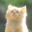

In [5]:
display(Image.open('img.jpg').resize((32,32)))

In [9]:
cat = Image.open('img.jpg')

transform = T.Compose([
    T.ToTensor(),
    T.Resize((32, 32))])

cat = transform(cat).unsqueeze(0).to('cuda')

conv_models = [m for _, m in net.named_modules()
               if isinstance(m, nn.Conv2d)]

for conv in conv_models:
    conv.register_forward_hook(show_one_model)

D:\Program Files\Python3.10\lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [10]:
cat.cuda()

tensor([[[[0.3020, 0.3176, 0.3529,  ..., 0.4078, 0.4275, 0.4275],
          [0.3216, 0.3255, 0.3333,  ..., 0.3843, 0.4039, 0.4157],
          [0.3373, 0.3490, 0.3294,  ..., 0.3569, 0.3765, 0.3725],
          ...,
          [0.2941, 0.2941, 0.2980,  ..., 0.4157, 0.3569, 0.3373],
          [0.2784, 0.2745, 0.2863,  ..., 0.4549, 0.4078, 0.3647],
          [0.2824, 0.2784, 0.2824,  ..., 0.5059, 0.4745, 0.4235]],

         [[0.4353, 0.4510, 0.4784,  ..., 0.5059, 0.5059, 0.5216],
          [0.4353, 0.4392, 0.4471,  ..., 0.4902, 0.5020, 0.5059],
          [0.4275, 0.4314, 0.4275,  ..., 0.4627, 0.4824, 0.4745],
          ...,
          [0.3608, 0.3569, 0.3647,  ..., 0.4353, 0.4039, 0.3686],
          [0.3608, 0.3569, 0.3608,  ..., 0.5255, 0.4706, 0.4275],
          [0.3686, 0.3608, 0.3569,  ..., 0.5765, 0.5608, 0.5059]],

         [[0.2392, 0.2510, 0.2863,  ..., 0.3804, 0.3961, 0.3961],
          [0.2627, 0.2667, 0.2667,  ..., 0.3686, 0.3843, 0.3922],
          [0.3137, 0.3098, 0.2745,  ..., 0

In [11]:
net.to('cuda')

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

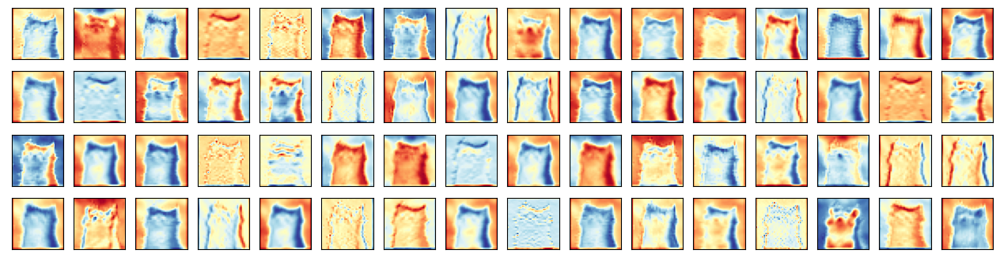

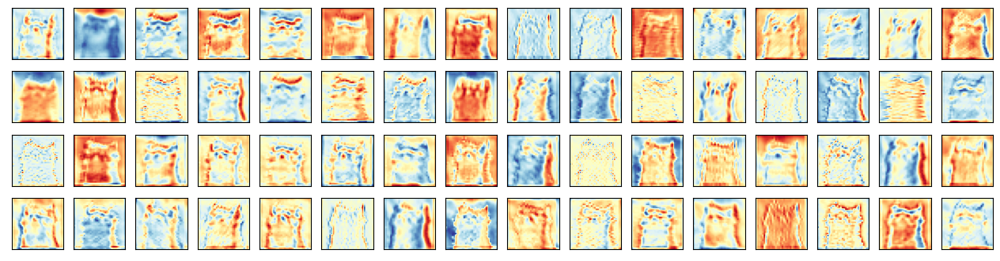

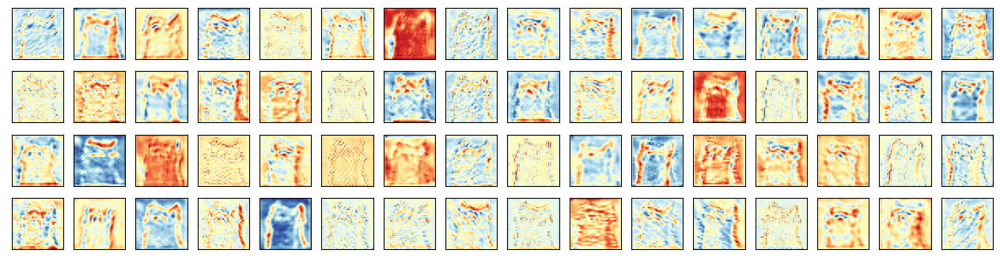

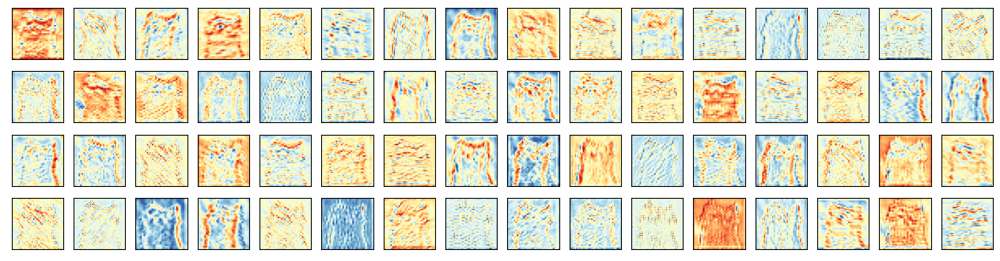

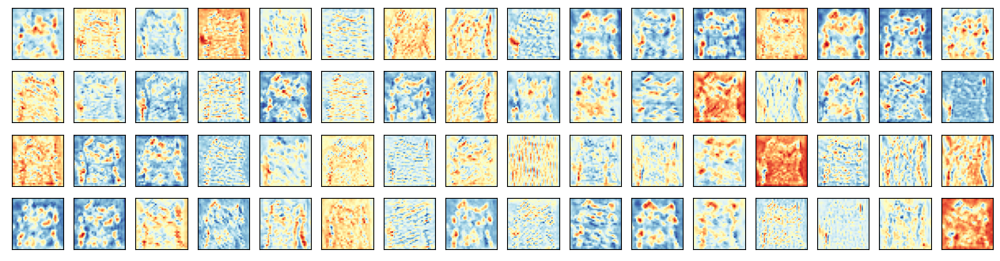

...

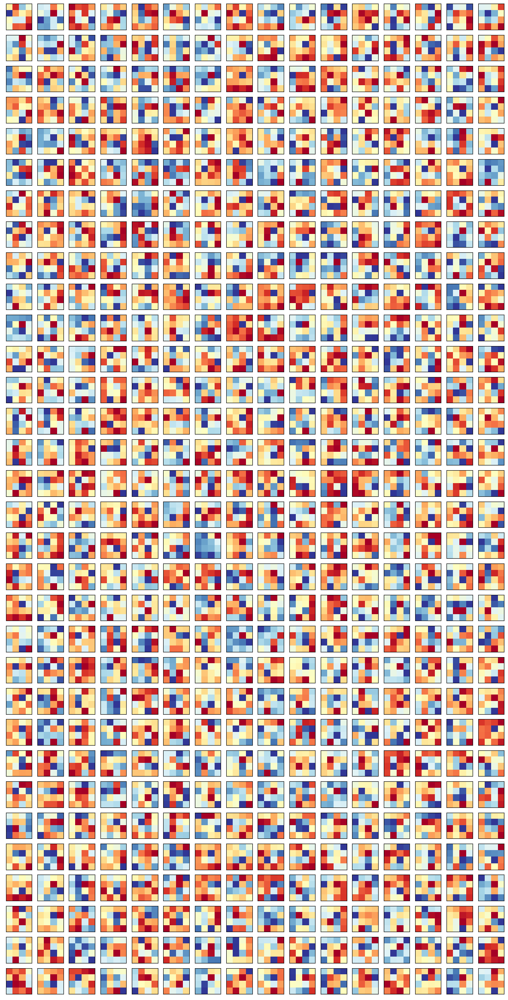

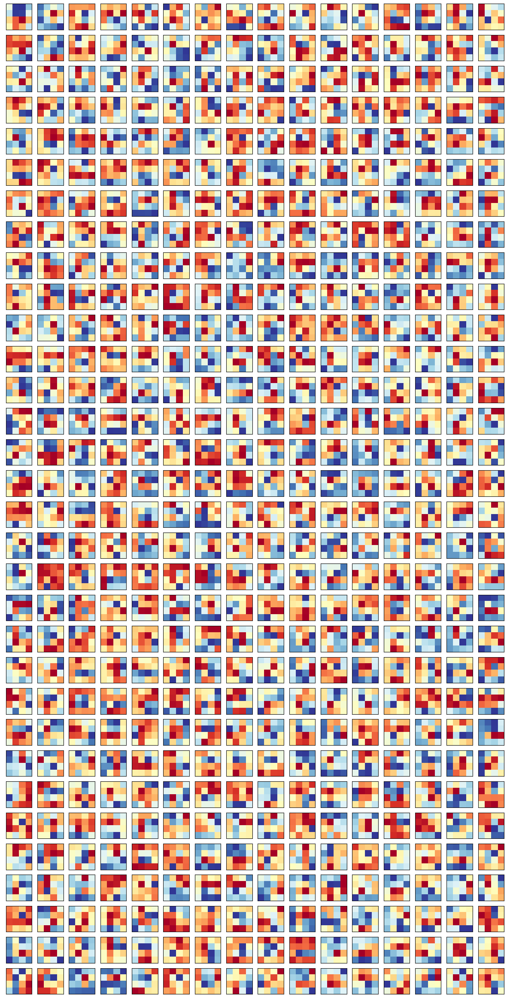

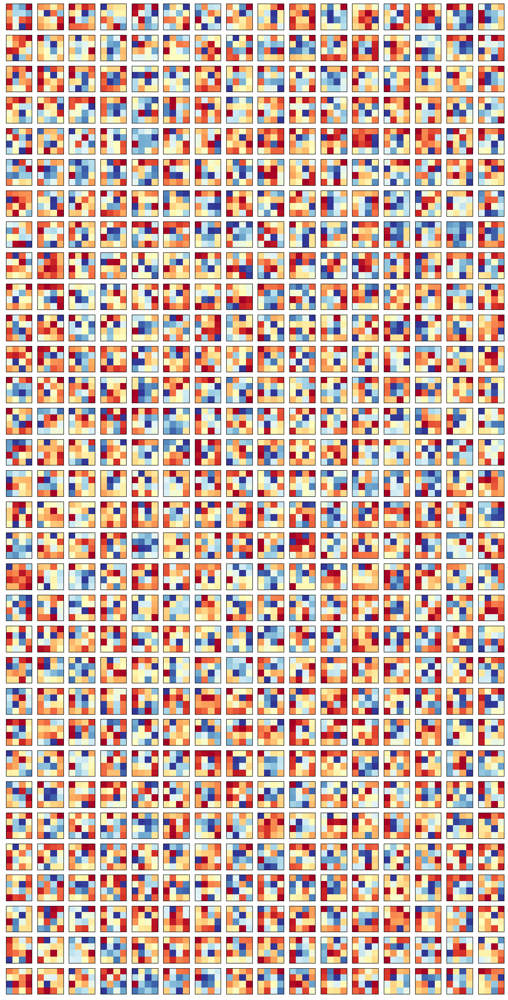

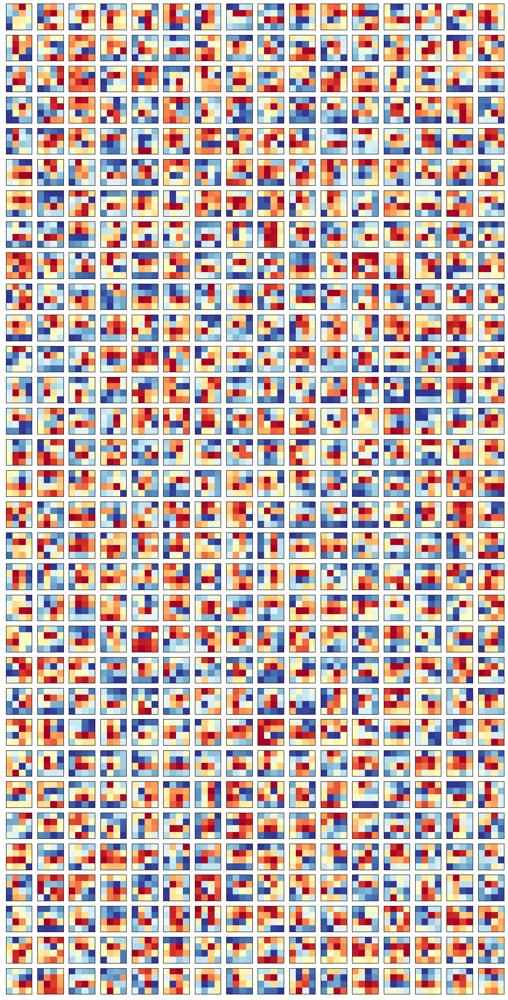

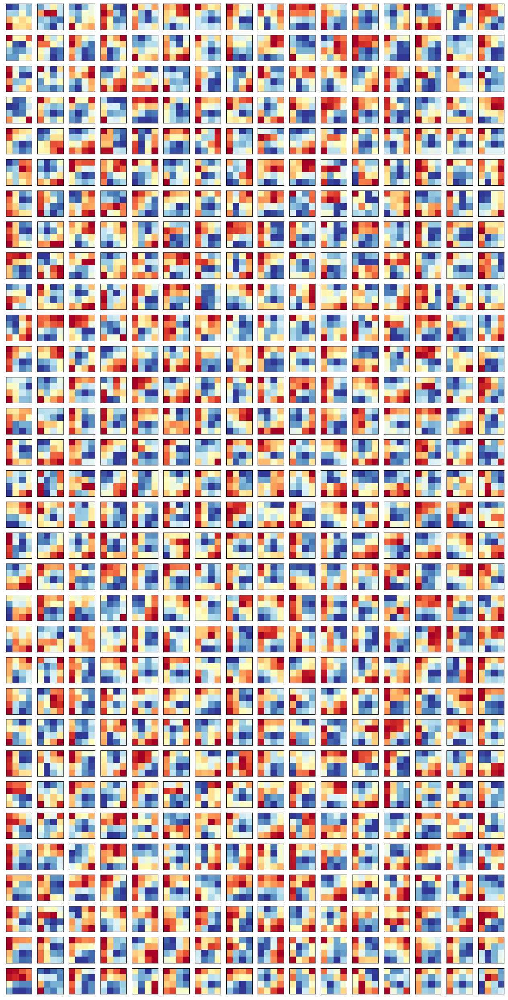

In [12]:
with torch.no_grad():
    output = net(cat)

## 0. Baseline

In [13]:
df_baseline = pd.read_csv('./results/activation/resnet18_baseline.csv')
df_baseline.head()

,0,train_loss,test_loss,train_acc,test_acc,lr
0,0,0.011277,0.004773,0.47140,0.5682,0.01
1,1,0.007295,0.003840,0.66884,0.6687,0.01
2,2,0.005530,0.002688,0.75066,0.7675,0.01
3,3,0.004602,0.002474,0.79490,0.7851,0.01
4,4,0.004005,0.002301,0.82356,0.8015,0.01


## 1. Activation

In [14]:
df_elu = pd.read_csv('./results/activation/resnet18_elu.csv')
df_gelu = pd.read_csv('./results/activation/resnet18_gelu.csv')
df_leakyrelu = pd.read_csv('./results/activation/resnet18_leakyrelu.csv')
df_mish = pd.read_csv('./results/activation/resnet18_mish.csv')

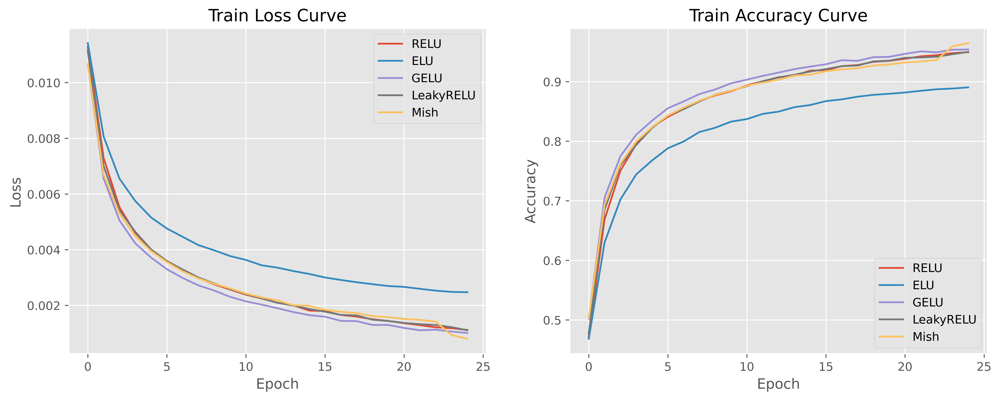

In [28]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 5), dpi=800)

ax1 = fig.add_subplot(121)
ax1.plot(df_baseline.train_loss, label='RELU')
ax1.plot(df_elu.train_loss, label='ELU')
ax1.plot(df_gelu.train_loss, label='GELU')
ax1.plot(df_leakyrelu.train_loss, label='LeakyRELU')
ax1.plot(df_mish.train_loss, label='Mish')
ax1.legend()
ax1.set(title='Train Loss Curve', ylabel='Loss', xlabel='Epoch')

# ax2 = fig.add_subplot(222)
# ax2.plot(df_baseline.test_loss, label='RELU')
# ax2.plot(df_elu.test_loss, label='ELU')
# ax2.plot(df_gelu.test_loss, label='GELU')
# ax2.plot(df_leakyrelu.test_loss, label='LeakyRELU')
# ax2.plot(df_mish.test_loss, label='Mish')
# ax2.legend()
# ax2.set(title='Test Loss Curve', ylabel='Loss', xlabel='Epoch')

ax3 = fig.add_subplot(122)
ax3.plot(df_baseline.train_acc, label='RELU')
ax3.plot(df_elu.train_acc, label='ELU')
ax3.plot(df_gelu.train_acc, label='GELU')
ax3.plot(df_leakyrelu.train_acc, label='LeakyRELU')
ax3.plot(df_mish.train_acc, label='Mish')
ax3.legend()
ax3.set(title='Train Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

# ax4 = fig.add_subplot(224)
# ax4.plot(df_baseline.test_acc, label='RELU')
# ax4.plot(df_elu.test_acc, label='ELU')
# ax4.plot(df_gelu.test_acc, label='GELU')
# ax4.plot(df_leakyrelu.test_acc, label='LeakyRELU')
# ax4.plot(df_mish.test_acc, label='Mish')
# ax4.legend()
# ax4.set(title='Test Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

plt.savefig(f'./results/activation/activation_loss_acc1.png')

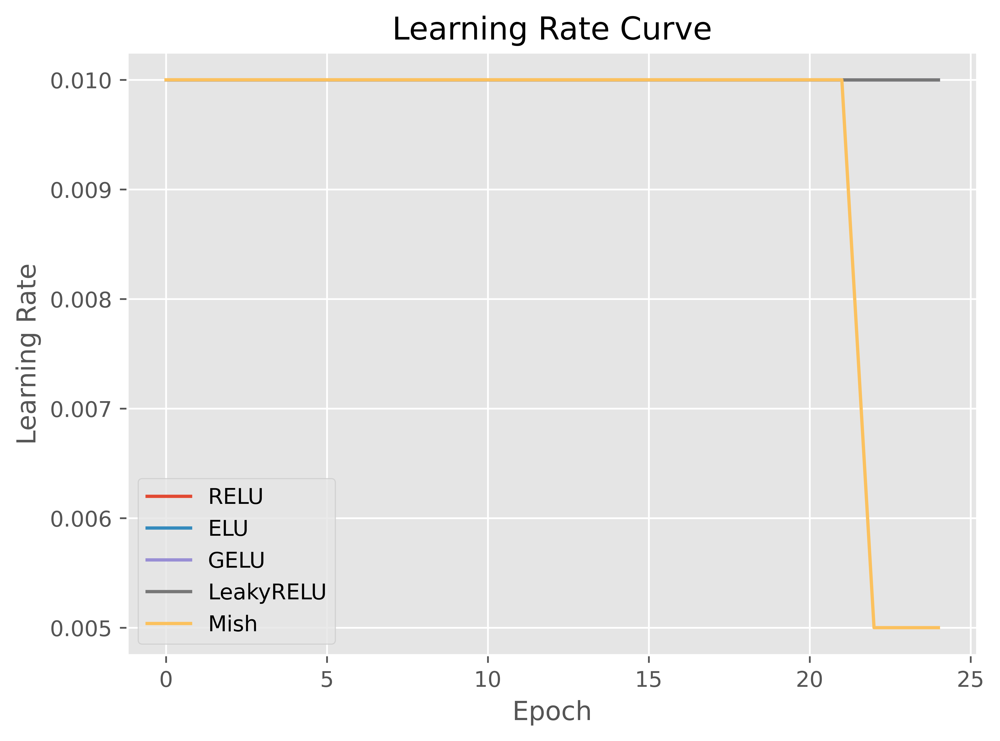

In [16]:
plt.style.use('ggplot')
plt.figure(figsize=(7, 5), dpi=800)
plt.plot(df_baseline.lr, label='RELU')
plt.plot(df_elu.lr, label='ELU')
plt.plot(df_gelu.lr, label='GELU')
plt.plot(df_leakyrelu.lr, label='LeakyRELU')
plt.plot(df_mish.lr, label='Mish')
plt.legend()
plt.title('Learning Rate Curve')
plt.ylabel('Learning Rate')
plt.xlabel('Epoch')

plt.savefig(f'./results/activation/activation_lr.png')

## 2. Optimizer

In [17]:
df_adadelta = pd.read_csv('./results/optimizer/resnet18_adadelta.csv')
df_adagrad = pd.read_csv('./results/optimizer/resnet18_adagrad.csv')
df_adam = pd.read_csv('./results/optimizer/resnet18_adam.csv')
df_adamax = pd.read_csv('./results/optimizer/resnet18_adamax.csv')

In [33]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 5), dpi=800)

ax1 = fig.add_subplot(221)
ax1.plot(df_baseline.train_loss, label='SGD')
ax1.plot(df_adadelta.train_loss, label='Adadelta')
ax1.plot(df_adagrad.train_loss, label='Adagrad')
ax1.plot(df_adam.train_loss, label='Adam')
ax1.plot(df_adamax.train_loss, label='Adamax')
ax1.legend()
ax1.set(title='Train Loss Curve', ylabel='Loss', xlabel='Epoch')

ax2 = fig.add_subplot(222)
ax2.plot(df_baseline.test_loss, label='SGD')
ax2.plot(df_adadelta.test_loss, label='Adadelta')
ax2.plot(df_adagrad.test_loss, label='Adagrad')
ax2.plot(df_adam.test_loss, label='Adam')
ax2.plot(df_adamax.test_loss, label='Adamax')
ax2.legend()
ax2.set(title='Test Loss Curve', ylabel='Loss', xlabel='Epoch')

ax3 = fig.add_subplot(223)
ax3.plot(df_baseline.train_acc, label='SGD')
ax3.plot(df_adadelta.train_acc, label='Adadelta')
ax3.plot(df_adagrad.train_acc, label='Adagrad')
ax3.plot(df_adam.train_acc, label='Adam')
ax3.plot(df_adamax.train_acc, label='Adamax')
ax3.legend()
ax3.set(title='Train Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

ax4 = fig.add_subplot(224)
ax4.plot(df_baseline.test_acc, label='SGD')
ax4.plot(df_adadelta.test_acc, label='Adadelta')
ax4.plot(df_adagrad.test_acc, label='Adagrad')
ax4.plot(df_adam.test_acc, label='Adam')
ax4.plot(df_adamax.test_acc, label='Adamax')
ax4.legend()
ax4.set(title='Test Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

plt.savefig(f'./results/optimizer/optimizer_loss_acc.png')

In [ ]:
plt.style.use('ggplot')
plt.figure(figsize=(7, 5), dpi=800)
plt.plot(df_baseline.lr, label='SGD')
plt.plot(df_adadelta.lr, label='Adadelta')
plt.plot(df_adagrad.lr, label='Adagrad')
plt.plot(df_adam.lr, label='Adam')
plt.plot(df_adamax.lr, label='Adamax')
plt.legend()
plt.title('Learning Rate Curve')
plt.ylabel('Learning Rate')
plt.xlabel('Epoch')

plt.savefig(f'./results/optimizer/optimizer_lr.png')

## 3. Learning Rate Schedule

In [30]:
df_cosanneal = pd.read_csv('./results/lr_scheduler/resnet18_cosanneal.csv')
df_exp = pd.read_csv('./results/lr_scheduler/resnet18_exp.csv')
df_linear = pd.read_csv('./results/lr_scheduler/resnet18_linear.csv')
df_step = pd.read_csv('./results/lr_scheduler/resnet18_step.csv')

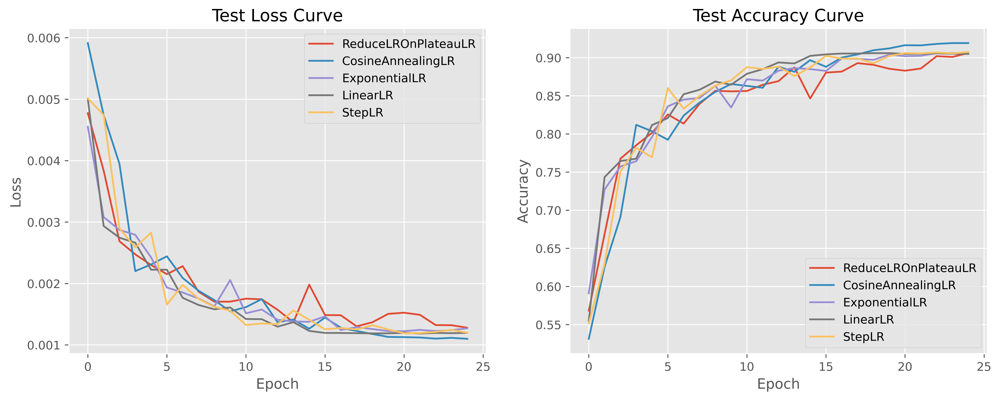

In [34]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 5), dpi=800)

# ax1 = fig.add_subplot(221)
# ax1.plot(df_baseline.train_loss, label='ReduceLROnPlateauLR')
# ax1.plot(df_cosanneal.train_loss, label='CosineAnnealingLR')
# ax1.plot(df_exp.train_loss, label='ExponentialLR')
# ax1.plot(df_linear.train_loss, label='LinearLR')
# ax1.plot(df_step.train_loss, label='StepLR')
# ax1.legend()
# ax1.set(title='Train Loss Curve', ylabel='Loss', xlabel='Epoch')

ax2 = fig.add_subplot(121)
ax2.plot(df_baseline.test_loss, label='ReduceLROnPlateauLR')
ax2.plot(df_cosanneal.test_loss, label='CosineAnnealingLR')
ax2.plot(df_exp.test_loss, label='ExponentialLR')
ax2.plot(df_linear.test_loss, label='LinearLR')
ax2.plot(df_step.test_loss, label='StepLR')
ax2.legend()
ax2.set(title='Test Loss Curve', ylabel='Loss', xlabel='Epoch')

# ax3 = fig.add_subplot(223)
# ax3.plot(df_baseline.train_acc, label='ReduceLROnPlateauLR')
# ax3.plot(df_cosanneal.train_acc, label='CosineAnnealingLR')
# ax3.plot(df_exp.train_acc, label='ExponentialLR')
# ax3.plot(df_linear.train_acc, label='LinearLR')
# ax3.plot(df_step.train_acc, label='StepLR')
# ax3.legend()
# ax3.set(title='Train Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

ax4 = fig.add_subplot(122)
ax4.plot(df_baseline.test_acc, label='ReduceLROnPlateauLR')
ax4.plot(df_cosanneal.test_acc, label='CosineAnnealingLR')
ax4.plot(df_exp.test_acc, label='ExponentialLR')
ax4.plot(df_linear.test_acc, label='LinearLR')
ax4.plot(df_step.test_acc, label='StepLR')
ax4.legend()
ax4.set(title='Test Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

plt.savefig(f'./results/lr_scheduler/lr_scheduler_loss_acc.png')

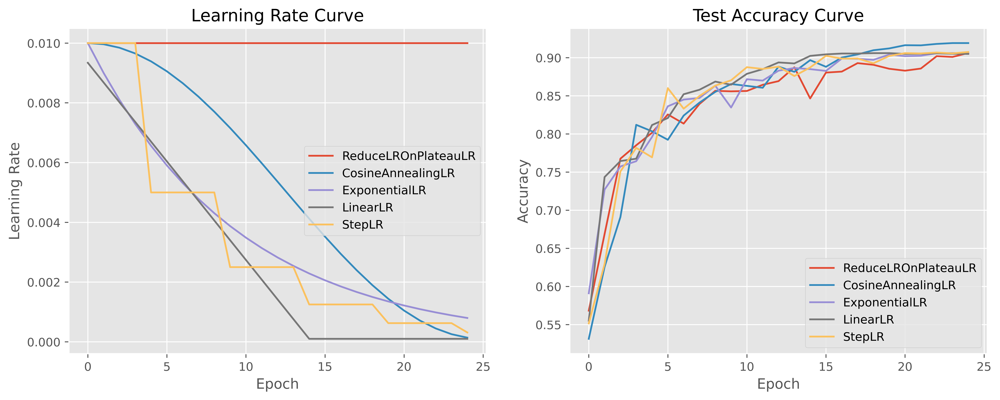

In [36]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 5), dpi=800)

# ax1 = fig.add_subplot(221)
# ax1.plot(df_baseline.train_loss, label='ReduceLROnPlateauLR')
# ax1.plot(df_cosanneal.train_loss, label='CosineAnnealingLR')
# ax1.plot(df_exp.train_loss, label='ExponentialLR')
# ax1.plot(df_linear.train_loss, label='LinearLR')
# ax1.plot(df_step.train_loss, label='StepLR')
# ax1.legend()
# ax1.set(title='Train Loss Curve', ylabel='Loss', xlabel='Epoch')

ax2 = fig.add_subplot(121)
ax2.plot(df_baseline.lr, label='ReduceLROnPlateauLR')
ax2.plot(df_cosanneal.lr, label='CosineAnnealingLR')
ax2.plot(df_exp.lr, label='ExponentialLR')
ax2.plot(df_linear.lr, label='LinearLR')
ax2.plot(df_step.lr, label='StepLR')
ax2.legend()
ax2.set(title='Learning Rate Curve', ylabel='Learning Rate', xlabel='Epoch')

# ax3 = fig.add_subplot(223)
# ax3.plot(df_baseline.train_acc, label='ReduceLROnPlateauLR')
# ax3.plot(df_cosanneal.train_acc, label='CosineAnnealingLR')
# ax3.plot(df_exp.train_acc, label='ExponentialLR')
# ax3.plot(df_linear.train_acc, label='LinearLR')
# ax3.plot(df_step.train_acc, label='StepLR')
# ax3.legend()
# ax3.set(title='Train Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

ax4 = fig.add_subplot(122)
ax4.plot(df_baseline.test_acc, label='ReduceLROnPlateauLR')
ax4.plot(df_cosanneal.test_acc, label='CosineAnnealingLR')
ax4.plot(df_exp.test_acc, label='ExponentialLR')
ax4.plot(df_linear.test_acc, label='LinearLR')
ax4.plot(df_step.test_acc, label='StepLR')
ax4.legend()
ax4.set(title='Test Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

plt.savefig(f'./results/lr_scheduler/lr_scheduler_loss_acc.png')

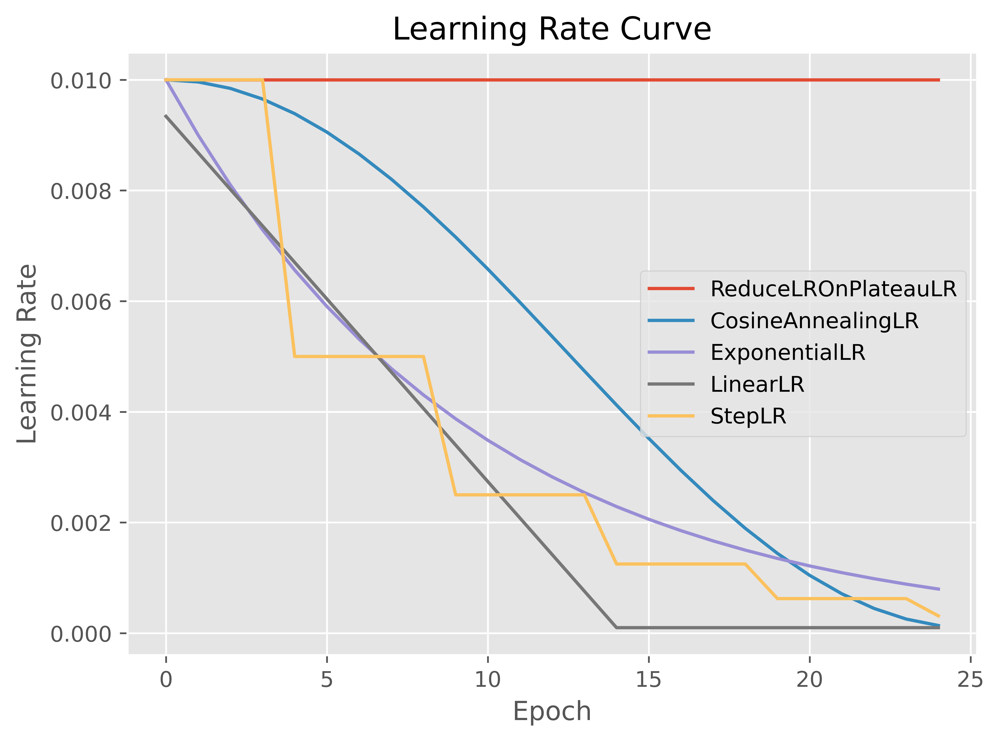

In [35]:
plt.style.use('ggplot')
plt.figure(figsize=(7, 5), dpi=800)
plt.plot(df_baseline.lr, label='ReduceLROnPlateauLR')
plt.plot(df_cosanneal.lr, label='CosineAnnealingLR')
plt.plot(df_exp.lr, label='ExponentialLR')
plt.plot(df_linear.lr, label='LinearLR')
plt.plot(df_step.lr, label='StepLR')
plt.legend()
plt.title('Learning Rate Curve')
plt.ylabel('Learning Rate')
plt.xlabel('Epoch')

plt.savefig(f'./results/lr_scheduler/lr_scheduler_lr.png')

## 4. Loss

In [19]:
df_bcelogit = pd.read_csv('./results/loss/resnet18_bcelogit.csv')
df_mse = pd.read_csv('./results/loss/resnet18_mse.csv')
df_huber = pd.read_csv('./results/loss/resnet18_huber.csv')
df_soft = pd.read_csv('./results/loss/resnet18_soft.csv')

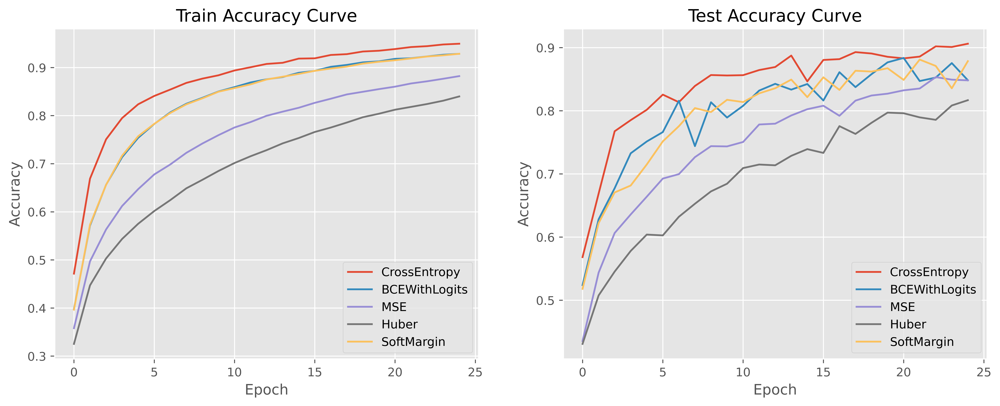

In [23]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(14, 5), dpi=800)

# ax1 = fig.add_subplot(221)
# ax1.plot(df_baseline.train_loss, label='CrossEntropy')
# ax1.plot(df_bcelogit.train_loss, label='BCEWithLogits')
# ax1.plot(df_mse.train_loss, label='MSE')
# ax1.plot(df_huber.train_loss, label='Huber')
# ax1.plot(df_soft.train_loss, label='SoftMargin')
# ax1.legend()
# ax1.set(title='Train Loss Curve', ylabel='Loss', xlabel='Epoch')

# ax2 = fig.add_subplot(222)
# ax2.plot(df_baseline.test_loss, label='SGD')
# ax2.plot(df_bcelogit.test_loss, label='BCEWithLogits')
# ax2.plot(df_mse.test_loss, label='MSE')
# ax2.plot(df_huber.test_loss, label='Huber')
# ax2.plot(df_soft.test_loss, label='SoftMargin')
# ax2.legend()
# ax2.set(title='Test Loss Curve', ylabel='Loss', xlabel='Epoch')

ax3 = fig.add_subplot(121)
ax3.plot(df_baseline.train_acc, label='CrossEntropy')
ax3.plot(df_bcelogit.train_acc, label='BCEWithLogits')
ax3.plot(df_mse.train_acc, label='MSE')
ax3.plot(df_huber.train_acc, label='Huber')
ax3.plot(df_soft.train_acc, label='SoftMargin')
ax3.legend()
ax3.set(title='Train Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

ax4 = fig.add_subplot(122)
ax4.plot(df_baseline.test_acc, label='CrossEntropy')
ax4.plot(df_bcelogit.test_acc, label='BCEWithLogits')
ax4.plot(df_mse.test_acc, label='MSE')
ax4.plot(df_huber.test_acc, label='Huber')
ax4.plot(df_soft.test_acc, label='SoftMargin')
ax4.legend()
ax4.set(title='Test Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

plt.savefig(f'./results/loss/loss_loss_acc.png')

In [ ]:
plt.style.use('ggplot')
plt.figure(figsize=(7, 5), dpi=800)
plt.plot(df_baseline.lr, label='SGD')
plt.plot(df_bcelogit.lr, label='BCEWithLogits')
plt.plot(df_mse.lr, label='MSE')
plt.plot(df_huber.lr, label='Huber')
plt.plot(df_soft.lr, label='SoftMargin')
plt.legend()
plt.title('Learning Rate Curve')
plt.ylabel('Learning Rate')
plt.xlabel('Epoch')

plt.savefig(f'./results/loss/loss_lr.png')

## 5. Weight Decay

In [24]:
df_1e_4 = pd.read_csv('./results/weight_decay/resnet18_0.0001.csv')
df_1e_3 = pd.read_csv('./results/weight_decay/resnet18_0.001.csv')
df_5e_3 = pd.read_csv('./results/weight_decay/resnet18_0.005.csv')
df_1e_2 = pd.read_csv('./results/weight_decay/resnet18_0.01.csv')

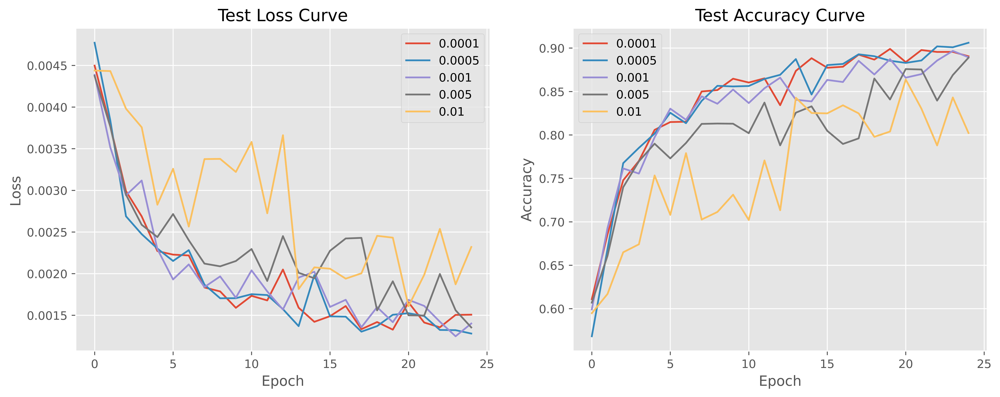

In [27]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(16, 11), dpi=800)

ax1 = fig.add_subplot(221)
ax1.plot(df_1e_4.train_loss, label='0.0001')
ax1.plot(df_baseline.train_loss, label='0.0005')
ax1.plot(df_1e_3.train_loss, label='0.001')
ax1.plot(df_5e_3.train_loss, label='0.005')
ax1.plot(df_1e_2.train_loss, label='0.01')
ax1.legend()
ax1.set(title='Train Loss Curve', ylabel='Loss', xlabel='Epoch')

ax2 = fig.add_subplot(222)
ax2.plot(df_1e_4.test_loss, label='0.0001')
ax2.plot(df_baseline.test_loss, label='0.0005')
ax2.plot(df_1e_3.test_loss, label='0.001')
ax2.plot(df_5e_3.test_loss, label='0.005')
ax2.plot(df_1e_2.test_loss, label='0.01')
ax2.legend()
ax2.set(title='Test Loss Curve', ylabel='Loss', xlabel='Epoch')

# ax3 = fig.add_subplot(223)
# ax3.plot(df_1e_4.train_acc, label='0.0001')
# ax3.plot(df_baseline.train_acc, label='0.0005')
# ax3.plot(df_1e_3.train_acc, label='0.001')
# ax3.plot(df_5e_3.train_acc, label='0.005')
# ax3.plot(df_1e_2.train_acc, label='0.01')
# ax3.legend()
# ax3.set(title='Train Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

ax4 = fig.add_subplot(224)
ax4.plot(df_1e_4.test_acc, label='0.0001')
ax4.plot(df_baseline.test_acc, label='0.0005')
ax4.plot(df_1e_3.test_acc, label='0.001')
ax4.plot(df_5e_3.test_acc, label='0.005')
ax4.plot(df_1e_2.test_acc, label='0.01')
ax4.legend()
ax4.set(title='Test Accuracy Curve', ylabel='Accuracy', xlabel='Epoch')

plt.savefig(f'./results/weight_decay/weight_decay_loss_acc.png')